# GD3. 잘 만든 Augmentation, 이미지 100장 안 부럽다

## (1) 개요
- Data augmentation은 갖고 있는 데이터셋을 여러 가지 방법으로 증강시켜 실적적인 학습 데이터셋의 규모를 키울 수 있는 방법임. 
- 일반적으로 하드디스크에 저장된 이미지 데이터를 메모리에 로드 후, 학습시킬 때 변형을 가하는 방법을 사용함. 
- 데이터가 많아진다는 것은 과적합을 줄일 수 있다는 것을 의미함. 
- 데이터셋이 실제 상황에서의 입력값과 다를 경우, augmentation을 통해서 실제 입력값과 비슷한 데이터 분포를 만들 수 있음. 
- 이렇게 data augmentation은 데이터를 늘릴 뿐만 아니라 모델이 실제 테스트 환경에서 잘 동작할 수 있도록 도와주기도 함. 

## (2) 다양한 Image Augmentation 방법
- image augmentation 기법에는 구체적으로 어떤 것들이 있는지 살펴보자. 
- 텐서플로우 튜토리얼에 소개된 image augmentation 예제들부터 살펴보자. 

### Flipping
- Flip은 좌우나 상하로 이미지를 대칭하는 기능임. 
- 분류 문제에서는 문제가 없을 수 있지만, 물체 탐지, 세그멘테이션 문제 등 정확한 정답 영역이 존재하는 문제에 적용할 때는 라벨도 같이 좌우 반전을 해줘야 함.
- 숫자나 알파벳 문제를 인식하는 문제에 적용할 때도 주의가 필요함 -> 상하나 좌우가 반전될 경우 다른 문자가 될 수 있음.  


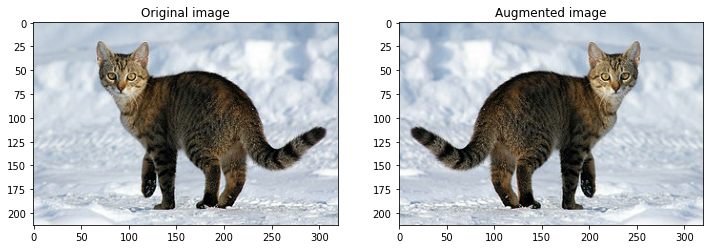

### Gray Scale
- 3가지 채널을 가진 RGB 이미지를 하나의 채널을 갖도록 해준다. 아래의 시각화 예제는 흑백 대신 다른 색상으로 이미지를 표현함. 
- RGB 각각의 채널마다 가중치를 주어 가중합을 했다. 사용된 가중치의 경우 합이 1이 됨을 알 수 있다.  
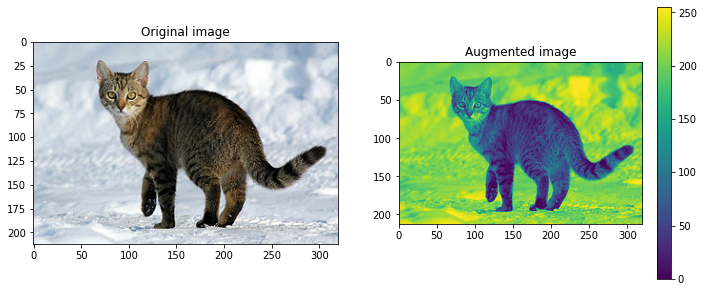

### Saturation
- RGB 이미지를 HSV(Hue(색조), Saturation(채도), Value(명도)의 3가지 성분으로 색을 표현) 이미지로 변경하고 S 채널에 오프셋을 적용, 조금 더 이미지를 선명하게 만들어준다. 이후 다시 RGB 색상 모델로 변경해줌.  
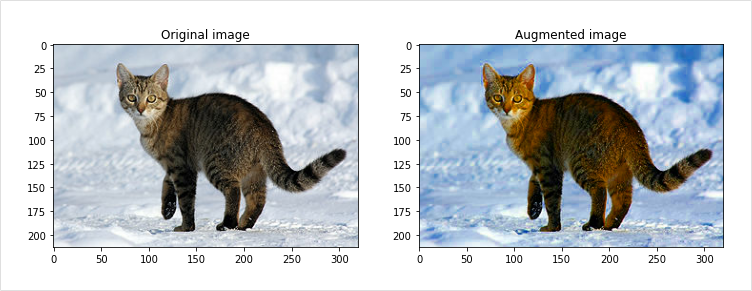

### Brightness
- 밝기를 조정할 수도 있음. RGB 채널에서 값을 더해주면 밝아지고, 빼주면 어두워짐.  
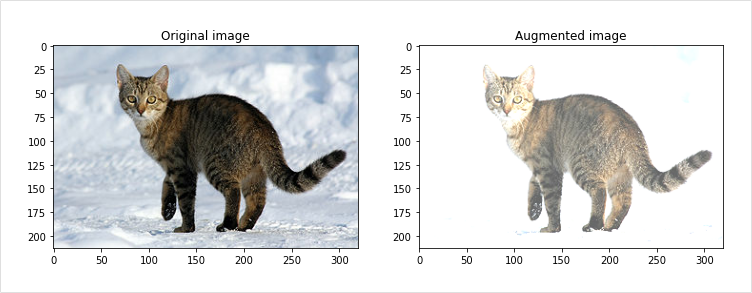

### Rotation
- 이미지의 각도를 변환함. 90도의 경우 직사각형 형태가 유지됙에 이미지의 크기만 조절하면 바로 사용 가능함. 
- 90도 단위가 아닌 경우 직사각형 형태에서 기존 이미지로 채우지 못하는 영역을 어떻게 처리해야 할지 유의해야 함.  
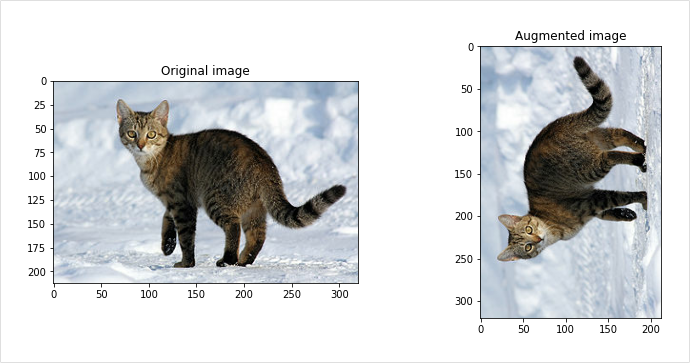

### Center Crop
- 이미지의 중앙을 기준으로 확대하는 방법. 너무 작게 center crop을 할 경우 본래 가진 라벨과 맞지 않을 수 있기에 주의. 예컨대 고양이 라벨의 이미지를 확대해 한 장 더 만들어내려면, 이미지 내에 고양이의 형상을 유지해야하고 털만 보이는 이미지를 만들어서는 안 됨.  
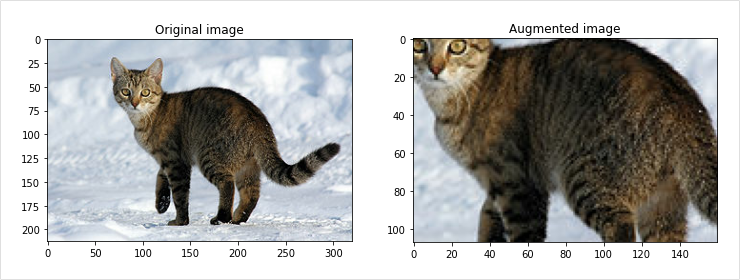

- 이 외에도 Gaussian noise, Contrast change, Sharpen, Affine transformation, Padding, Blurring 등의 기법이 있다.

## (3) 텐서플로우를 활용한 Image Augmentation - Flip

In [1]:
import tensorflow as tf
from PIL import Image
import matplotlib.pyplot as plt
import os

sample_img_path = '/content/drive/MyDrive/Colab Notebooks/AIFFEL/Going Deeper/data/GD3/images/mycat.jpeg'
sample_img_path

'/content/drive/MyDrive/Colab Notebooks/AIFFEL/Going Deeper/data/GD3/images/mycat.jpeg'

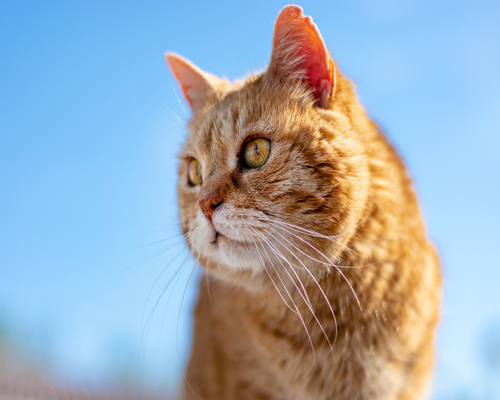

In [2]:
image = Image.open(sample_img_path).resize((500, 400))
image_tensor = tf.keras.preprocessing.image.img_to_array(image)

image

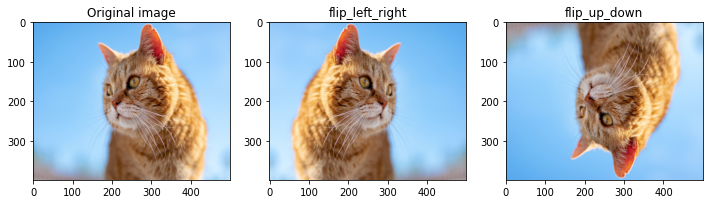

In [3]:
flip_lr_tensor = tf.image.flip_left_right(image_tensor)
flip_ud_tensor = tf.image.flip_up_down(image_tensor)
flip_lr_image = tf.keras.preprocessing.image.array_to_img(flip_lr_tensor)
flip_ud_image = tf.keras.preprocessing.image.array_to_img(flip_ud_tensor)

plt.figure(figsize=(12, 12))

plt.subplot(1,3,1)
plt.title('Original image')
plt.imshow(image)

plt.subplot(1,3,2)
plt.title('flip_left_right')
plt.imshow(flip_lr_image)

plt.subplot(1,3,3)
plt.title('flip_up_down')
plt.imshow(flip_ud_image)

plt.show()

- 위의 함수들은 일괄적으로 상하 또는 좌우 반전을 적용함. 
- 이를 확률에 따라 적용되도록 하면 반전이 되지 않은 원본 데이터도 활용할 수 있음. 
- `random_flip_left_right`와 `random_flip_up_down`을 활용함.
- 아래 코드를 반복해 돌려보면서 random augmentation이 어떻게 작동하는지 직접 확인해보자.

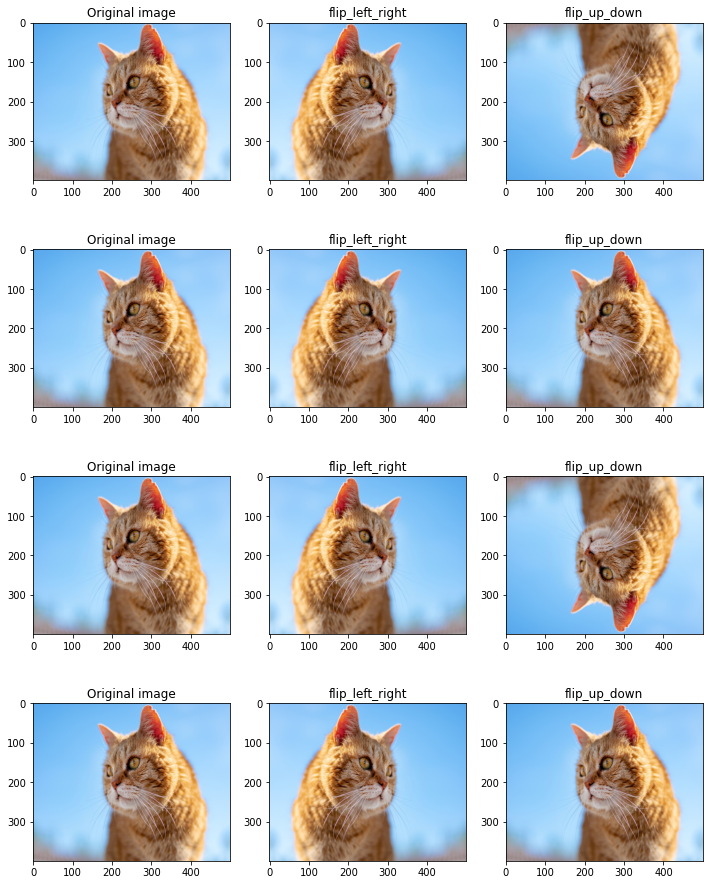

In [4]:
plt.figure(figsize=(12, 16))

row = 4
for i in range(row):
    flip_lr_tensor = tf.image.random_flip_left_right(image_tensor)
    flip_ud_tensor = tf.image.random_flip_up_down(image_tensor)
    flip_lr_image = tf.keras.preprocessing.image.array_to_img(flip_lr_tensor)
    flip_ud_image = tf.keras.preprocessing.image.array_to_img(flip_ud_tensor)
    
    plt.subplot(4,3,i*3+1)
    plt.title('Original image')
    plt.imshow(image)

    plt.subplot(4,3,i*3+2)
    plt.title('flip_left_right')
    plt.imshow(flip_lr_image)

    plt.subplot(4,3,i*3+3)
    plt.title('flip_up_down')
    plt.imshow(flip_ud_image)

## (4) 텐서플로우를 사용한 Image Augmentation - Center Crop
- 단순하게 중심점을 기준으로 사진을 확대하는 것으로 생각하기 쉽지만, 적용 시 주의해야 함.
- `central_fraction`은 얼마나 확대할지 조절하는 매개변수임. 
- 하지만 고양이 이미지의 경우 이미지를 확대하면 0.5까지는 보일 수 있지만 0.25 수준으로 내려가면 털만 보이고 고양이 형상을 찾기 어려울 수 있음. 따라서 `central_fraction`의 범위를 문제가 생기지 않는 범위에서 랜덤하게 조절되도록 해야함.

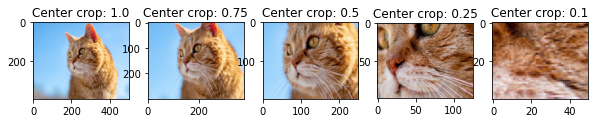

In [5]:
plt.figure(figsize=(12, 15))

central_fractions = [1.0, 0.75, 0.5, 0.25, 0.1]
col = len(central_fractions)
for i, frac in enumerate(central_fractions):
  cropped_tensor = tf.image.central_crop(image_tensor, frac)
  cropped_img = tf.keras.preprocessing.image.array_to_img(cropped_tensor)

  plt.subplot(1, col+1, i+1)
  plt.title(f'Center crop: {frac}')
  plt.imshow(cropped_img)

- `central_crop`을 랜덤하게 적용하는 함수는 텐서플로우에서 기본적으로 제공되지 않음. 
- 파이썬의 `random` 모듈을 사용하거나 텐서플로우의 랜덤 모듈을 사용해도 됨. 
- `tf.random.uniform`을 사용해 `central_fraction` 매개변수에 전달할 값을 만들고, 이를 사용해 랜덤한 `cropped_tensor`를 만들어내는 `random_central_crop()` 함수임. 

In [6]:
def random_central_crop(image_tensor, range=(0, 1)):
    central_fraction = tf.random.uniform([1], minval=range[0], maxval=range[1], dtype=tf.float32)
    cropped_tensor = tf.image.central_crop(image_tensor, central_fraction)
    return cropped_tensor

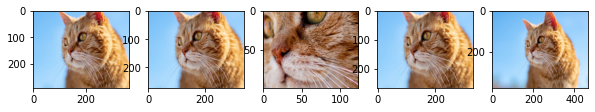

In [7]:
plt.figure(figsize=(12, 15))

col = 5
for i, frac in enumerate(central_fractions):
  cropped_tensor = random_central_crop(image_tensor)
  cropped_img = tf.keras.preprocessing.image.array_to_img(cropped_tensor)

  plt.subplot(1, col+1, i+1)
  plt.imshow(cropped_img)

- 텐서플로우의 `tf.random` 모듈에는 `tf.random.uniform()`과 `tf.random.normal()` 등이 있는데, 이 둘은 랜덤값을 uniform distribution으로 뽑는 것과 normal distribution으로 뽑는 차이임.
- normal distribution의 경우 mean, std를 통해서 분포를 조절할 수 있음. 

## (5) 텐서플로우를 사용한 Image Augmentation
### tf.image.random_crop()

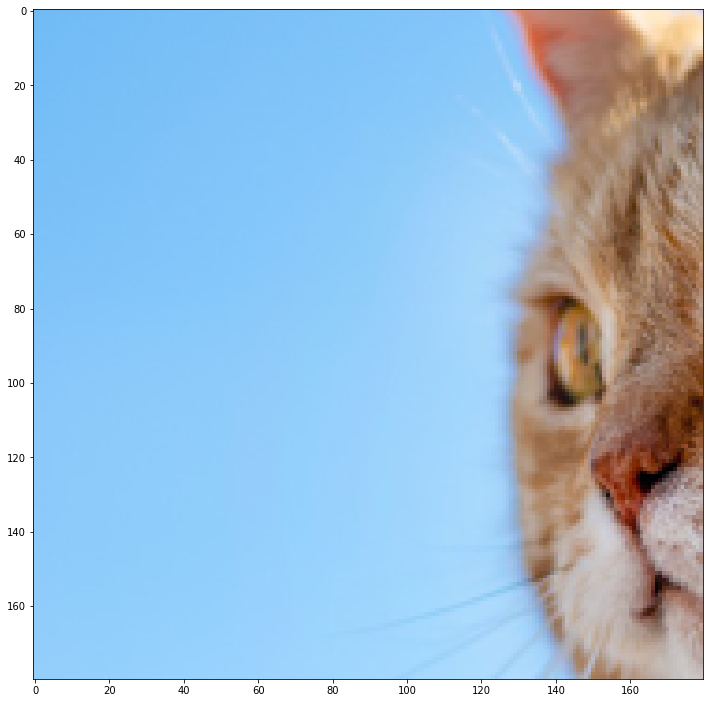

In [8]:
# apply random_crop on cat image
plt.figure(figsize=(12, 15))

random_crop_tensor = tf.image.random_crop(image_tensor,[180,180,3])
random_crop_image = tf.keras.preprocessing.image.array_to_img(random_crop_tensor)

plt.imshow(random_crop_image)
plt.show()

### tf.image.random_brightness()

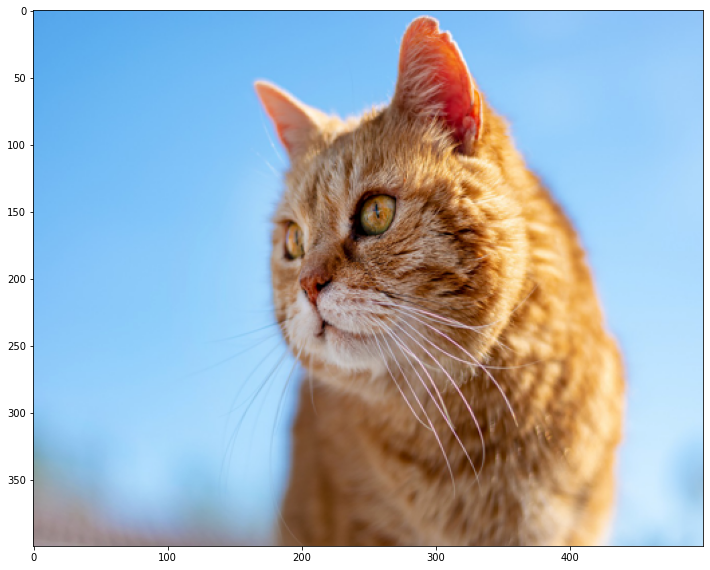

In [9]:
# apply random_brightness on cat image
plt.figure(figsize=(12, 15))

random_bright_tensor = tf.image.random_brightness(image_tensor, max_delta=128)
random_bright_tensor = tf.clip_by_value(random_bright_tensor, 0, 255)
random_bright_image = tf.keras.preprocessing.image.array_to_img(random_bright_tensor)

plt.imshow(random_bright_image)
plt.show()

- `tf.image.random_brightness()`만 적용할 경우 이미지 텐서 값의 범위가 0\~255를 초과할 수 있음. 
- 이 경우 `plt.imshow()`에서 rescale되어 밝기 변경 효과가 상쇄되어 보일 수도 있음. 
- 따라서 `tf.image.random_brightness()` 다음에는 `tf.clip_by_value()`를 적용해야 함. 

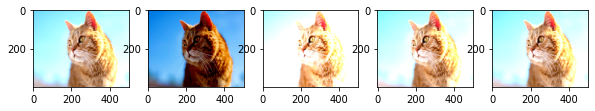

In [10]:
# display 5 random brightness images
plt.figure(figsize=(12, 15))

col = 5
for i in range(5):
    random_bright_tensor = tf.image.random_brightness(image_tensor, max_delta=128)
    random_bright_tensor = tf.clip_by_value(random_bright_tensor, 0, 255)
    random_bright_image = tf.keras.preprocessing.image.array_to_img(random_bright_tensor)

    plt.subplot(1,col+1,i+1)
    plt.imshow(random_bright_image)

## Albumentations 라이브러리
- 이미지 증강을 위한 파이썬 라이브러리임. 
- 이미지 증강은 딥러닝 및 컴퓨터 비전 작업에서 훈련된 모델의 품질을 높이는 데 사용됨.
- `augmentation`에서는 배열을 이미지의 기본 형태로 사용함. 따라서 PIL Image 데이터형을 넘파이 배열로 변환해 사용.

In [11]:
import numpy as np
image = Image.open(sample_img_path).resize((400, 300)) # 이미지에 따라 숫자를 바꾸어 보세요.
image_arr = np.array(image)
image_arr.shape

(300, 400, 3)

In [12]:
# 편하게 이미지를 볼 수 있는 함수 생성
def visualize(image):
    plt.figure(figsize=(20, 10))
    plt.imshow(image)

### tansforms.Affine()
- `transforms.Affine()`의 `Affine()`은 아핀 변환(Affine transform)을 이미지에 적용함. 
- 2D 변환의 일종인 아핀 변환은 이미지의 스케일을 조절하거나, 평행이동, 회전 등의 변환을 줄 수 있음. 
- 아래 코드는 -45도와 45도 사이에 랜덤하게 각도를 변환하는 augmentation을 10장 볼 수 있음. 

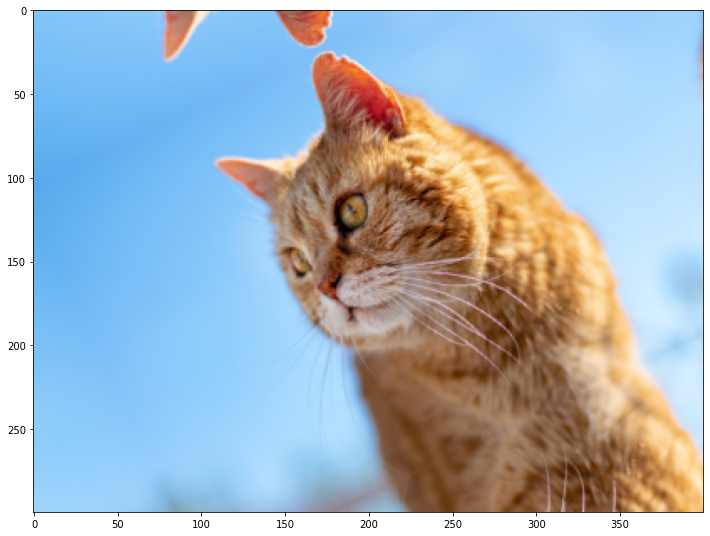

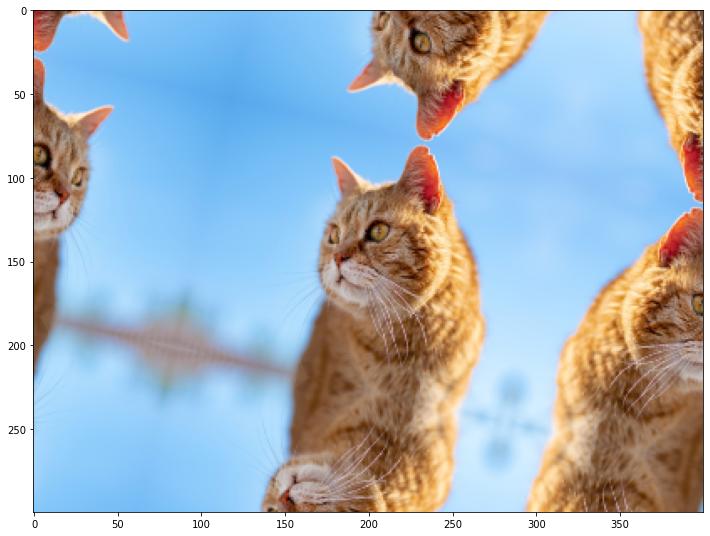

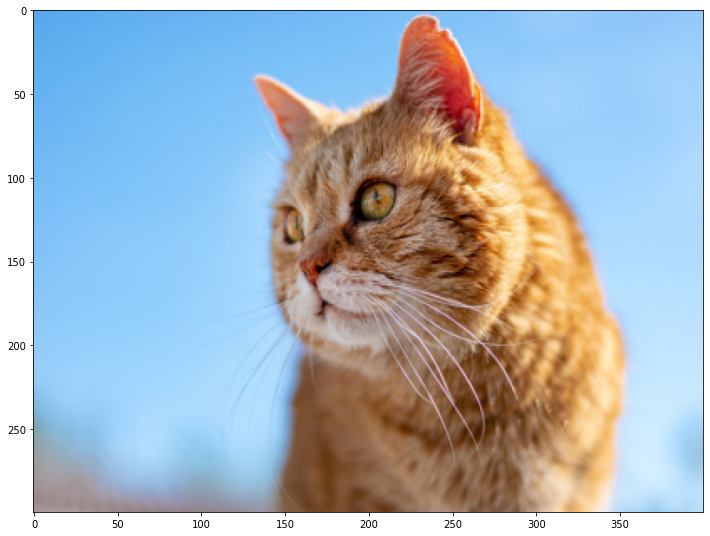

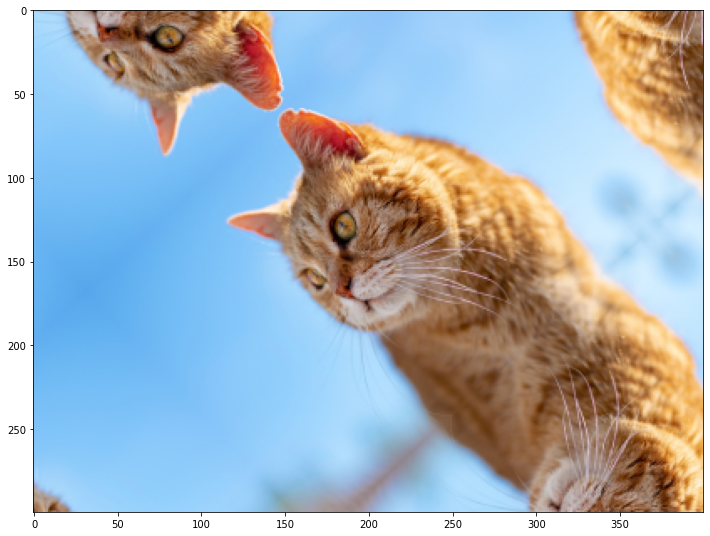

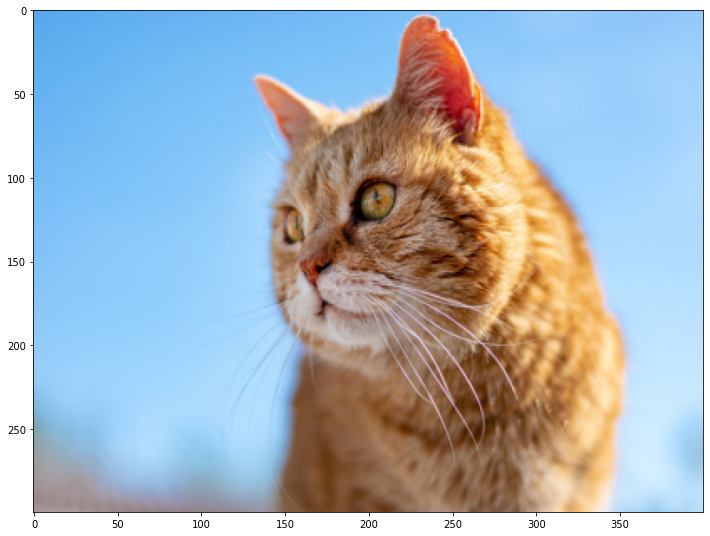

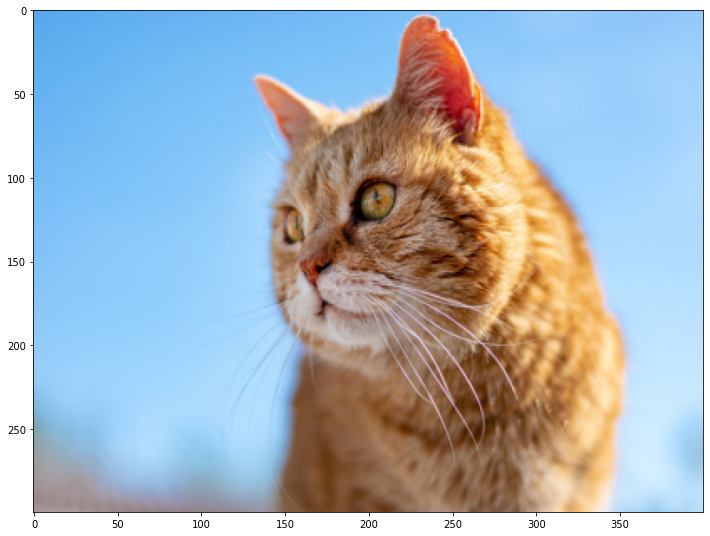

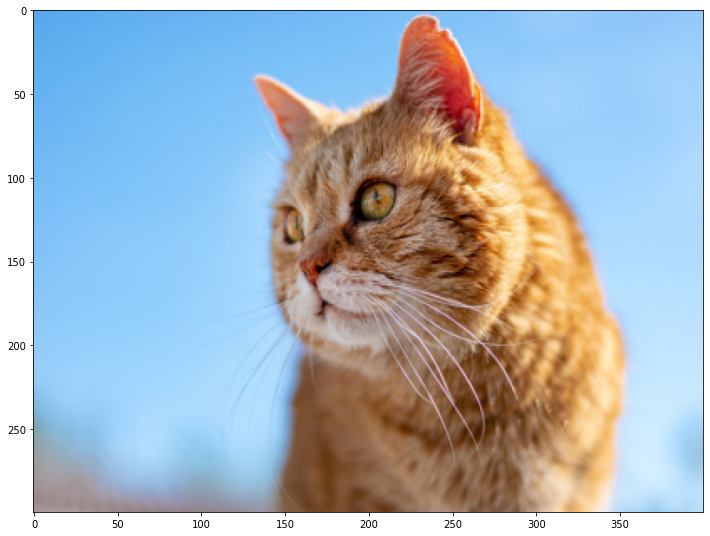

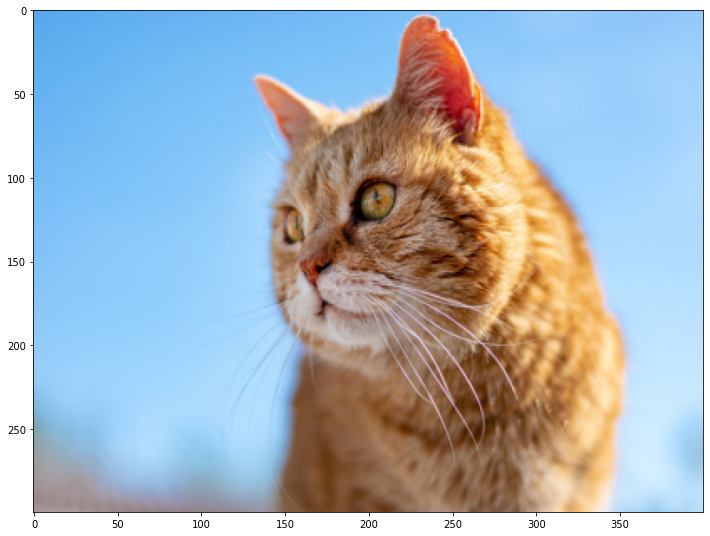

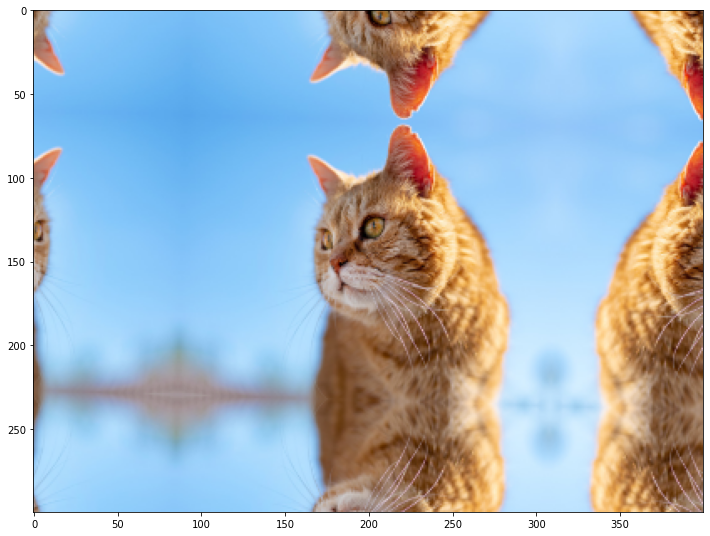

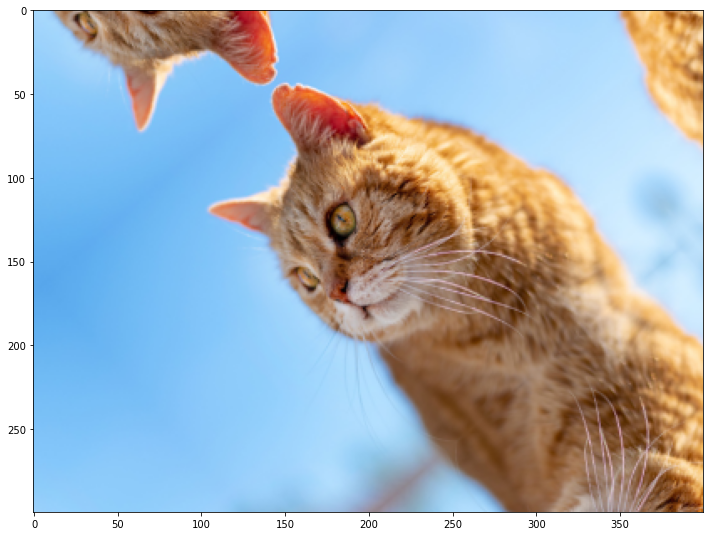

In [13]:
import albumentations as A

for i in range(10):
    transform = A.Compose([
        A.IAAAffine(rotate=(-45, 45),scale=(0.5,0.9),p=0.5) 
    ])
    transformed = transform(image=image_arr)
    plt.figure(figsize=(12,12))
    plt.imshow((transformed['image']))
    plt.show()

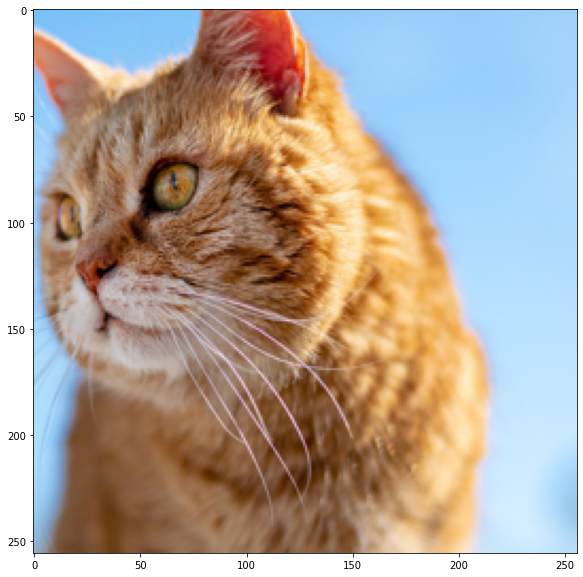

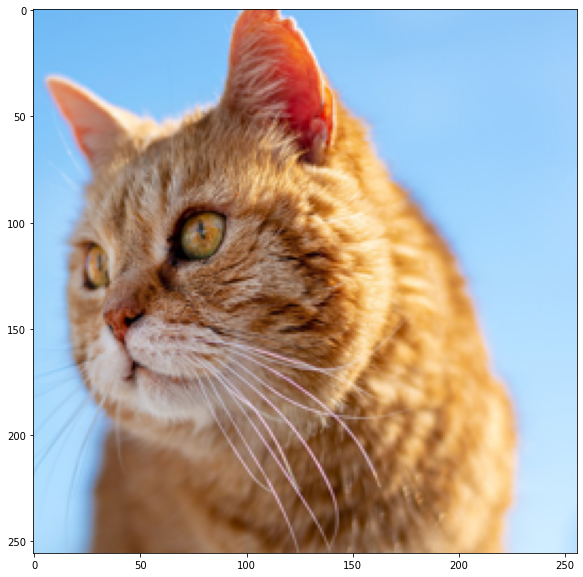

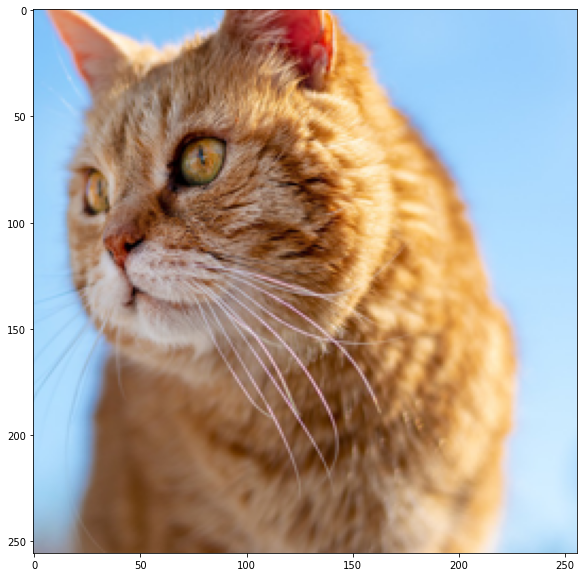

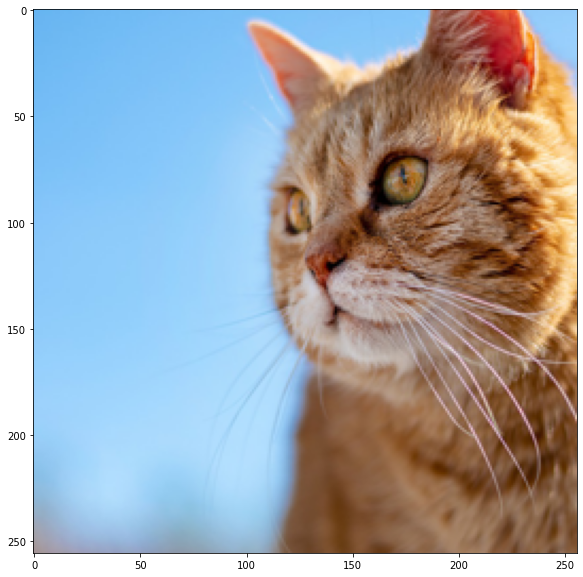

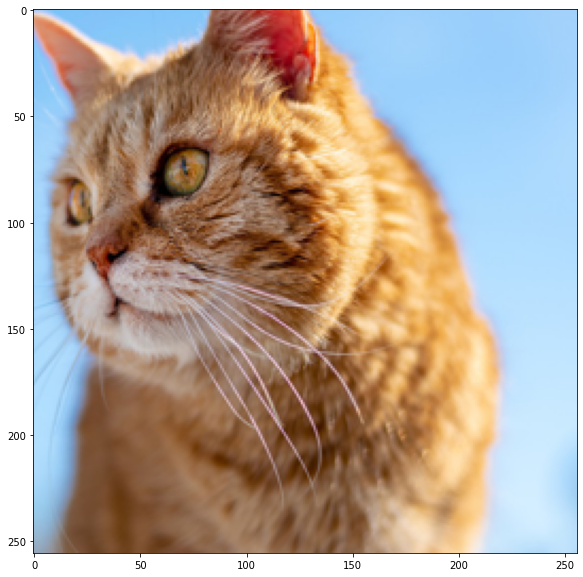

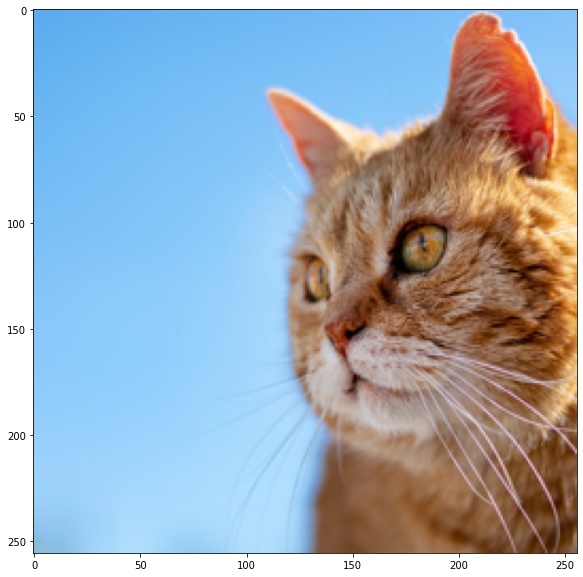

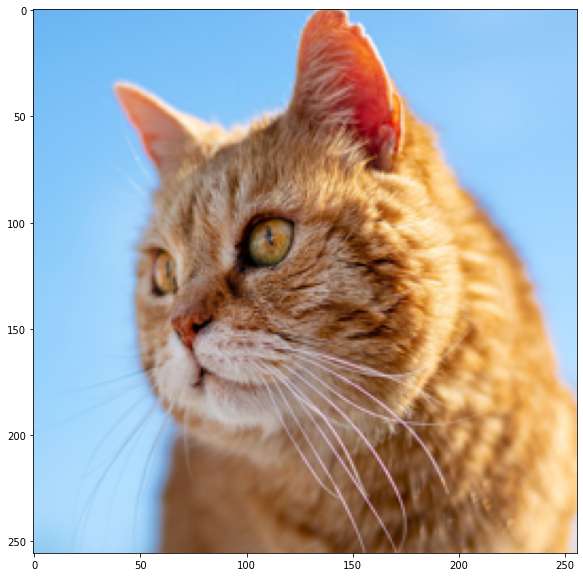

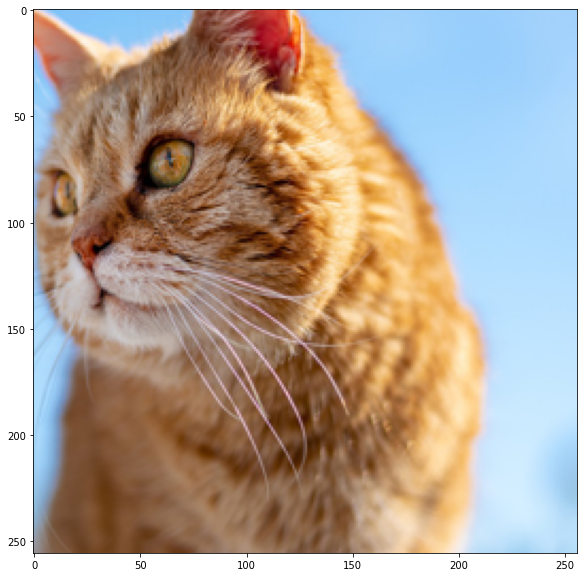

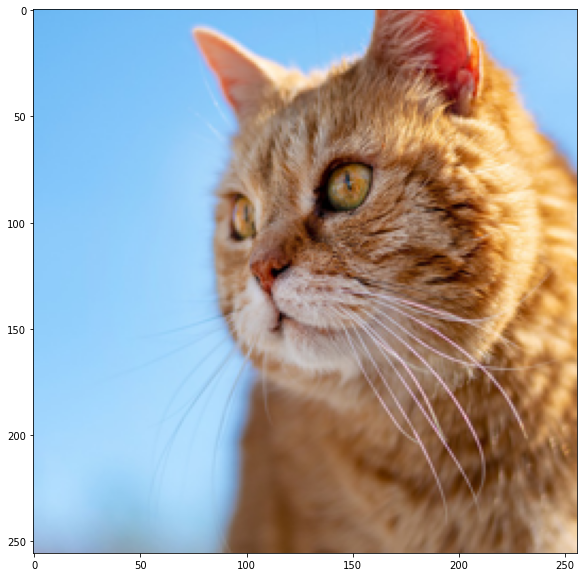

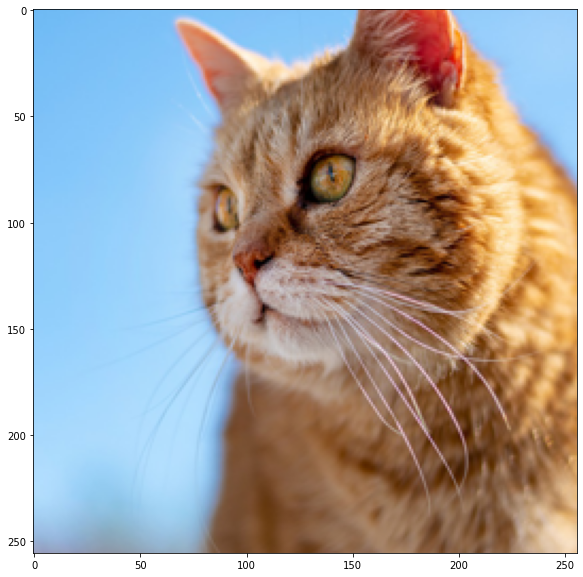

In [14]:
import random
for i in range(10):
    transform = A.Compose(
        [A.RandomCrop(width=256, height=256)]
    )
    transformed = transform(image=image_arr)
    visualize(transformed['image'])

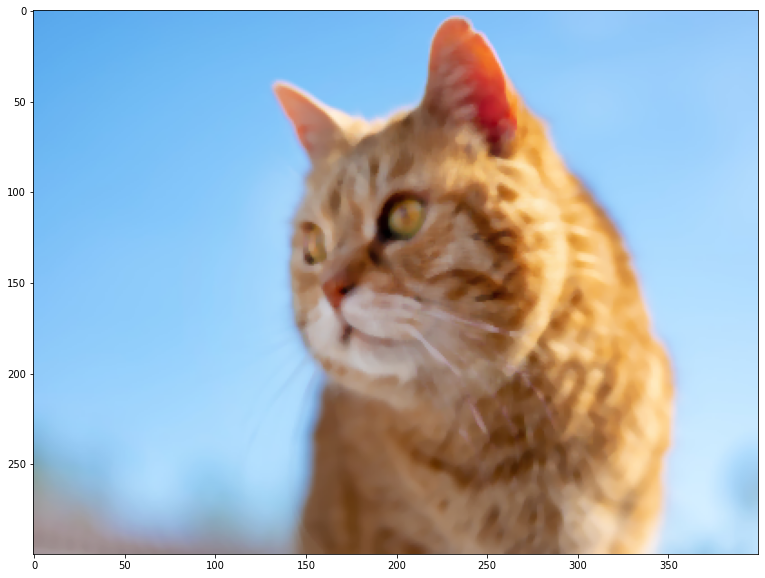

In [15]:
transform = A.Compose(
    [
    A.MedianBlur (blur_limit=7, always_apply=False, p=0.5)]
    
)
transformed = transform(image=image_arr)
visualize(transformed['image'])